# Topological Control of Dynamical Networks

### Network and Master Stability Function
In this notebook, we will consider topogical constrol of dynamcal networks. The network to be considered is
$$
\dot{x}_i = f(x_i) -\epsilon \sum_{j =1}^n \xi_{ij} P x_j \quad i = 1, 2, \ldots, n
$$

The auxilary system corresponding to the master stability fucntion is
$$
\dot{\zeta} = (Df(s) - \epsilon \lambda_k P) \zeta) \quad k = 1, 2, \ldots, n
$$.
where $ s $ is the special solution of the node dynamics, i.e., $ \dot{s} = f(s) $, $Df$ is the jacobian matrix
calculated at $ s $. For the system to achieve full synchronization is that eigenmodes corresponding to $k = 2, 3,
\ldots, n $ must be stable, that is, the master stability fucntion msust be negative.

### Full Syncronization Based on MSF
To get insight about this topic, we had better to consider an example. Let us construct a network

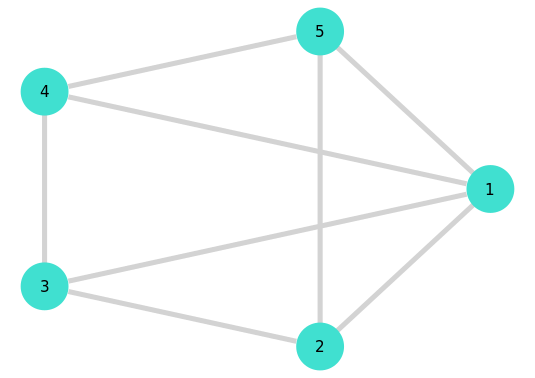

In [1]:
using LightGraphs
using GraphPlot

n = 5   # Number of nodes in the network
gr = cycle_graph(n)
add_edge!(gr, 1, 3)
add_edge!(gr, 1, 4)
add_edge!(gr, 2, 5)
gplot(gr, nodelabel=1:nv(gr), layout=circular_layout)

Let us consider that the nodes of the network is Lorenz system defined as
$$
f([x, y, z]) = \left\{
\begin{aligned}
\dot{x} &= \sigma (y - x) \\
\dot{y} &= x (\rho - z) - y \\
\dot{z} &= x y - \beta z  \\
\end{aligned}
\right.
$$

Load package

In [2]:
using LyapunovExponents
using LinearAlgebra
using Plots

Node dynamics

In [3]:
ds = Lorenz()

LyapunovExponents.Lorenz(10.0, 2.6666666666666665, 28.0, 0.0, [0.7884096036127028, 0.15645913838106473, 0.933781912287893])

Let the nodes in the network be coupled to each other through x states, that is, $P = diag(x, 0, 0)$.

In [4]:
P = diagm([1, 0, 0])
d = size(P, 1)  # Node dimension

3

Let $\eta = \epsilon \lambda$,

In [5]:
Ψ(η) = msf(ds, η, P)

Ψ (generic function with 1 method)

Plot the $\Psi$ with respect to $\eta$.

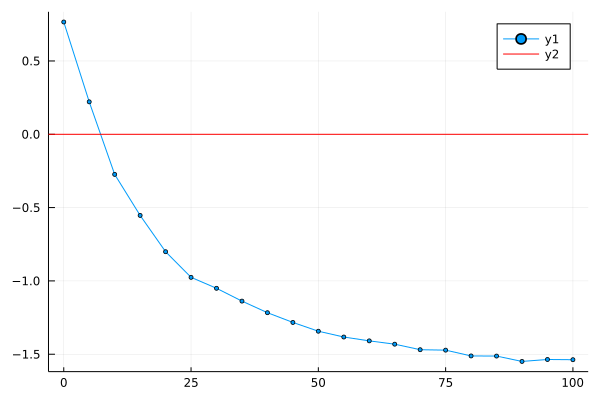

In [6]:
η = range(0, 100, length=21)
Λ = Ψ.(η)
plot(η, Λ, marker=(:circle, 3))
hline!([0.], color="red")

From the plot of the MSF, it is clear that when $\eta = \epsilon \lambda > 10 $, the eigenmode corresponding to $
\lambda $ is stable. Let us check the stability of the network given above.

In [7]:
ϵ = 100
Ξ = collect(laplacian_matrix(gr))
λ = eigvals(Ξ)
Λnet = Ψ.(ϵ * λ[2 : end])

4-element Vector{Float64}:
 -1.7153522930715985
 -1.7175924158361
 -1.771538446373207
 -1.7696568044287142

Note that all transveral modes are stable. This implies that the network achieves full synchronization. T
Let us construct the network first.

In [8]:
net = Network(Lorenz, -ϵ * Ξ, P)
sol = solvenet(net, (0., 100.), saveat=0.001)
t, x = sol.t, sol.u;

The plot the errors of the nodes.

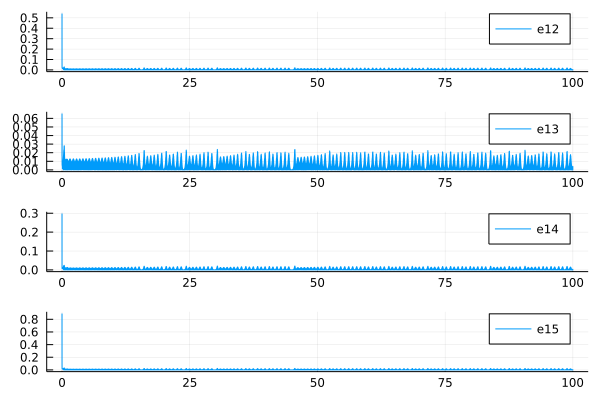

In [9]:
x1 = getindex.(x, 1)
plt = plot(layout = (n - 1, 1))
for i in 2 : n
    xi = getindex.(x, (i - 1) * d + 1)
    plot!(t, abs.(x1 - xi), label = "e1$i", subplot=i - 1)
end
display(plt)

### Cluster synchronization
Note that the network given above has a topological sysmmetry. Eaxh sysmmetry can be associated with a permutation
metrix $ P = [p_{ij}] $. If the change of node $i$ and node $j$ does change the network topology, $ p_{ij} = 1 $,
otherwise $ p_{ij} = 0 $. Let the permutation matrix $ P $ digoanlized as
$$
M^{-1} P M = diag(\mu_1, \mu_2, \ldots, \mu_n)
$$
Then the outer connectivity matrix $ \Xi $ can be transformed as
$$
G =
\begin{bmatrix}
B & 0 \\
0 & D \\
\end{bmatrix}
$$.
Since the matrix $ \Xi $ and the matrix $ G $ are similar, the eigenvalues of $ G $ and $ \Xi $. have same
eigenvalues. Let $ \lambda_1 = 0 $ be the eigenvalue fo $ D $, then the subspace of the dynamics corresponding to $ D
$ includes the synchronization manifold. Hence $ D $ is the synchronized subspace and $ B $ is the transversal
subspace. For the cluster synchronization manifold to be stable, all the eigenmodes of the transversal subspace mustbe
be stable (all the maximum lyapunov exponents must be negative). To avoid full synchronization, at least one of the
eigenmodes of the stable subspace must be unstable.

The sysmmetry matrix of the network is (since P is defined as innner coupling marix, let us denote the permutation
matrix Q)

In [10]:
Q = [
    1 0 0 0 0;
    0 0 0 0 1;
    0 0 0 1 0;
    0 0 1 0 0;
    0 1 0 0 0
]

M = eigvecs(Q)
G = inv(M) * Ξ * M
B = G[1 : 2, 1 : 2]
D = G[3 : 5, 3 : 5]
λB = eigvals(B)
λD = eigvals(D)
@show λB
@show λD;

λB = [2.9999999999999996, 5.0]
λD = [4.440892098500626e-16, 3.0000000000000013, 5.000000000000002]


Note that the submatrix $ D $ has $ 0 $ eigenvalue. Synchronized state corresponds $ D $, and the transvesal mode $ B
$ corresponds to submatrix $ B $. Thus master stability function $ \Psi $ must be negative for the eigenvalues of $ B
$ and at least one of those corresponding to $ D $ must be positive.

In [11]:
@show Ψ.(ϵ * λB)
@show Ψ.(ϵ * λD)

Ψ.(ϵ * λB) = [-1.735899158037627, -1.771538446373207]
Ψ.(ϵ * λD) = [0.7569710523483741, -1.714391949502088, -1.7696568044287142]


3-element Vector{Float64}:
  0.7569710523483741
 -1.714391949502088
 -1.7696568044287142

Note that all the nontrivial modes of the nodes of $ D $ are stable. Thus the cluster sychronization implied by the
sysmmetry of the topology is not stable. .

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*